In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import json
from datasets import load_dataset


dataset = load_dataset("gsm8k", "main")
train_questions = np.array(dataset["train"]["question"])
train_answers = np.array(dataset["train"]['answer'])

test_questions = np.array(dataset["test"]["question"])
test_answers = np.array(dataset["test"]['answer'])


/data/katie_kang/miniconda3/envs/trlx2/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [9]:
def get_stats(train_name):
    num_memorized_all = []
    num_correct_different_all = []
    num_incorrect_all = []
    perplexities_all = []


    if "Qwen" in train_name and "3epochs" in train_name:
        ckpts = ["62", "124", "186"] 
    elif "Qwen" in train_name and "6epochs" in train_name:
        ckpts = ["62", "124", "186", "249", "311", "372"] 
    elif "6epochs_half" in train_name:
        ckpts = ["29", "58", "87", "116", "145", "174"]
    elif "3epochs_half" in train_name:
        ckpts = ["29", "58", "87"]
    elif "12epochs_quarter" in train_name:
        ckpts = ["29", "58", "87", "116", "145"]
    elif "24epochs_eighth" in train_name:
        ckpts = ["29", "58", "87", "116", "145"]
    elif "_6epochs" in train_name:
        ckpts = ["58", "116", "175", "233", "292", "348"]
    elif "_12epochs" in train_name:
        ckpts = ["116", "232", "348", "464", "580", "696"]
    elif "_1epochs" in train_name:
        ckpts = ["58"]
    elif "_3epochs" in train_name:
        ckpts = ["58", "116", "174"]

    for ckpt in ckpts:
        try:
            train_correct = (np.load("ckpts/"+train_name+"/checkpoint-"+ckpt+ "/train_answer_types5_seed2.npy")==0)
            train_samples = (np.load("ckpts/"+train_name+"/checkpoint-"+ckpt+ "/train_answers5_seed2.npy"))
        except:
            train_correct = (np.load("ckpts/"+train_name+"/checkpoint-"+ckpt+ "/train_answer_types5_seed2_temp0.8.npy")==0)
            train_samples = (np.load("ckpts/"+train_name+"/checkpoint-"+ckpt+ "/train_answers5_seed2_temp0.8.npy"))
            
        if "half" in train_name:
            subsample_idxs = np.load("ckpts/"+train_name+"/subsample_idxs.npy")
            train_correct = train_correct[subsample_idxs]
            train_samples = train_samples[subsample_idxs]
        else:
            subsample_idxs = np.arange(len(train_answers))

        num_memorized_ckpt = []
        num_correct_different_ckpt = []
        num_incorrect_ckpt = []

        for input_idx in range(len(subsample_idxs)):
            num_memorized = 0
            num_correct_different = 0
            num_incorrect = 0
            for sample_idx in range(5):
                correct = train_correct[input_idx, sample_idx]
                if correct:
                    if train_samples[input_idx][sample_idx].strip() == train_answers[subsample_idxs[input_idx]].strip():
                        num_memorized+=1
                    else:
                        num_correct_different+=1
                else:
                    num_incorrect+=1 
            num_memorized_ckpt.append(num_memorized)
            num_correct_different_ckpt.append(num_correct_different)
            num_incorrect_ckpt.append(num_incorrect)
        
        num_memorized_all.append(num_memorized_ckpt)
        num_correct_different_all.append(num_correct_different_ckpt)
        num_incorrect_all.append(num_incorrect_ckpt)
        
        
        perplexities = np.load("ckpts/"+train_name+"/checkpoint-"+ckpt+ "/train_perplexities.npy")[subsample_idxs]
        perplexities_all.append(perplexities)
        
    num_memorized_all = np.array(num_memorized_all)
    num_correct_different_all = np.array(num_correct_different_all)
    num_incorrect_all = np.array(num_incorrect_all)
    perplexities_all = np.array(perplexities_all)
    
    test_accs_all = []
    test_samples_all = []

    for ckpt in ckpts:
        try:
            test_accs = (np.load("ckpts/"+train_name+"/checkpoint-"+ckpt+ "/test_answer_types50_seed2.npy")==0)
            test_samples = (np.load("ckpts/"+train_name+"/checkpoint-"+ckpt+ "/test_answers50_seed2.npy"))
        except:
            try:
                test_accs = (np.load("ckpts/"+train_name+"/checkpoint-"+ckpt+ "/test_answer_types50_seed2_temp0.8.npy")==0)
                test_samples = (np.load("ckpts/"+train_name+"/checkpoint-"+ckpt+ "/test_answers50_seed2_temp0.8.npy"))
            except:
                test_accs = (np.load("ckpts/"+train_name+"/checkpoint-"+ckpt+ "/test_answer_types5_seed2_temp0.8.npy")==0)
                test_samples = (np.load("ckpts/"+train_name+"/checkpoint-"+ckpt+ "/test_answers5_seed2_temp0.8.npy"))
        test_accs_all.append(test_accs)
        test_samples_all.append(test_samples)

    test_accs_all = np.array(test_accs_all)
    test_samples_all = np.array(test_samples_all)
    
    return_dict = {}
    return_dict["num_memorized_all"] = num_memorized_all
    return_dict["num_correct_different_all"] = num_correct_different_all
    return_dict["num_incorrect_all"] = num_incorrect_all
    return_dict["perplexities_all"] = perplexities_all
    return_dict["test_accs_all"] = test_accs_all
    return_dict["test_samples_all"] = test_samples_all
    
    return return_dict



In [54]:
stats_dict5 = get_stats("gsm8k_orig_6epochs_full_lr5e-05_bs128")
stats_dict7 = get_stats("gsm8k_orig_6epochs_full_lr5e-07_bs128")
stats_dict4 = get_stats("gsm8k_orig_6epochs_full_lr0.0002_bs128")

In [55]:
stats_dict5_1 = get_stats("gsm8k_orig_1epochs_full_lr5e-05_bs128")
stats_dict7_1 = get_stats("gsm8k_orig_1epochs_full_lr5e-07_bs128")
stats_dict4_1 = get_stats("gsm8k_orig_1epochs_full_lr0.0002_bs128")

In [56]:
stats_dict5_3 = get_stats("gsm8k_orig_3epochs_full_lr5e-05_bs128")
stats_dict7_3 = get_stats("gsm8k_orig_3epochs_full_lr5e-07_bs128")
stats_dict4_3 = get_stats("gsm8k_orig_3epochs_full_lr0.0002_bs128")

In [11]:
stats_dict5_3_qwen = get_stats("gsm8k_orig_3epochs_full_lr5e-05_bs120_Qwen-14B")
# stats_dict7_3_qwen = get_stats("gsm8k_orig_3epochs_full_lr5e-07_bs120_Qwen-14B")
stats_dict4_3_qwen = get_stats("gsm8k_orig_3epochs_full_lr0.0002_bs120_Qwen-14B")



In [12]:
stats_dict5_6_qwen = get_stats("gsm8k_orig_6epochs_full_lr5e-05_bs120_Qwen-14B")
stats_dict7_6_qwen = get_stats("gsm8k_orig_6epochs_full_lr5e-07_bs120_Qwen-14B")
# stats_dict4_6_qwen = get_stats("gsm8k_orig_6epochs_full_lr0.0002_bs120_Qwen-14B")



In [59]:
stats_dict5_3_half = get_stats("gsm8k_orig_3epochs_half_lr5e-05_bs128")
stats_dict7_3_half = get_stats("gsm8k_orig_3epochs_half_lr5e-07_bs128")
stats_dict4_3_half = get_stats("gsm8k_orig_3epochs_half_lr0.0002_bs128")

In [60]:
stats_dict5_6_half = get_stats("gsm8k_orig_6epochs_half_lr5e-05_bs128")
stats_dict5_12_quarter = get_stats("gsm8k_orig_12epochs_quarter_lr5e-05_bs128")
stats_dict5_24_eighth = get_stats("gsm8k_orig_24epochs_eighth_lr5e-05_bs128")


Text(0.5, 0, 'Average training accuracy')

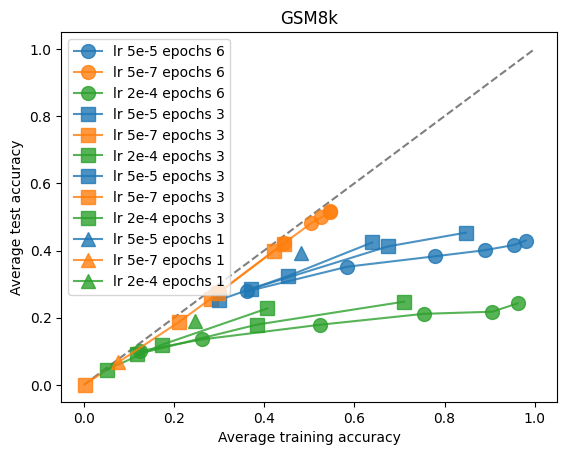

In [68]:



plt.plot([0, 1], [0, 1], "--", color="black", alpha=0.5)


plt.plot((1-stats_dict5["num_incorrect_all"]/5).mean(axis=1), ((stats_dict5["test_accs_all"]).mean(axis=1).mean(axis=1)), "o-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 6")
plt.plot((1-stats_dict7["num_incorrect_all"]/5).mean(axis=1), ((stats_dict7["test_accs_all"]).mean(axis=1).mean(axis=1)), "o-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 6")
plt.plot((1-stats_dict4["num_incorrect_all"]/5).mean(axis=1), ((stats_dict4["test_accs_all"]).mean(axis=1).mean(axis=1)), "o-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 6")
# plt.plot(ratios_dict7_2["ratio_memorized1"]+ratios_dict7_2["ratio_unmemorized"], ratios_dict7_2["avg_test_acc"], "o-")


plt.plot((1-stats_dict5_3["num_incorrect_all"]/5).mean(axis=1), ((stats_dict5_3["test_accs_all"]).mean(axis=1).mean(axis=1)), "s-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
plt.plot((1-stats_dict7_3["num_incorrect_all"]/5).mean(axis=1), ((stats_dict7_3["test_accs_all"]).mean(axis=1).mean(axis=1)), "s-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 3")
plt.plot((1-stats_dict4_3["num_incorrect_all"]/5).mean(axis=1), ((stats_dict4_3["test_accs_all"]).mean(axis=1).mean(axis=1)), "s-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 3")

plt.plot((1-stats_dict5_3_half["num_incorrect_all"]/5).mean(axis=1), ((stats_dict5_3_half["test_accs_all"]).mean(axis=1).mean(axis=1)), "s-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
plt.plot((1-stats_dict7_3_half["num_incorrect_all"]/5).mean(axis=1), ((stats_dict7_3_half["test_accs_all"]).mean(axis=1).mean(axis=1)), "s-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 3")
plt.plot((1-stats_dict4_3_half["num_incorrect_all"]/5).mean(axis=1), ((stats_dict4_3_half["test_accs_all"]).mean(axis=1).mean(axis=1)), "s-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 3")


plt.plot((1-stats_dict5_1["num_incorrect_all"]/5).mean(axis=1), ((stats_dict5_1["test_accs_all"]).mean(axis=1).mean(axis=1)), "^-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 1")
plt.plot((1-stats_dict7_1["num_incorrect_all"]/5).mean(axis=1), ((stats_dict7_1["test_accs_all"]).mean(axis=1).mean(axis=1)), "^-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 1")
plt.plot((1-stats_dict4_1["num_incorrect_all"]/5).mean(axis=1), ((stats_dict4_1["test_accs_all"]).mean(axis=1).mean(axis=1)), "^-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 1")


plt.legend()


plt.title("GSM8k")

plt.ylabel("Average test accuracy")

plt.xlabel("Average training accuracy")

Text(0.5, 0, 'Average train loss')

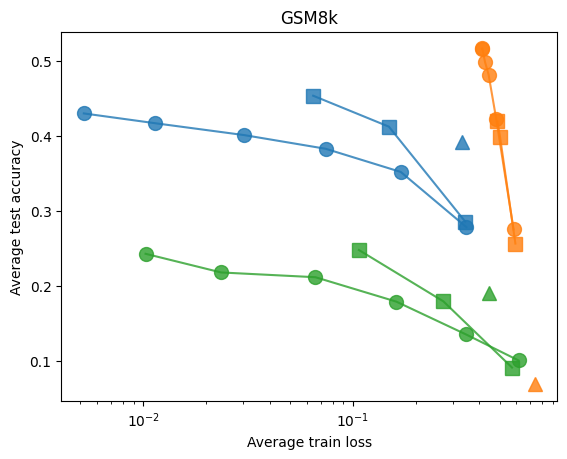

In [70]:





# plt.plot([0, 1], [0, 1], "--", color="black", alpha=0.5)


plt.plot(np.mean(np.log(stats_dict5["perplexities_all"]), axis=1), ((stats_dict5["test_accs_all"]).mean(axis=1).mean(axis=1)), "o-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 6")
plt.plot(np.mean(np.log(stats_dict7["perplexities_all"]), axis=1), ((stats_dict7["test_accs_all"]).mean(axis=1).mean(axis=1)), "o-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 6")
plt.plot(np.mean(np.log(stats_dict4["perplexities_all"]), axis=1), ((stats_dict4["test_accs_all"]).mean(axis=1).mean(axis=1)), "o-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 6")

plt.plot(np.mean(np.log(stats_dict5_3["perplexities_all"]), axis=1), ((stats_dict5_3["test_accs_all"]).mean(axis=1).mean(axis=1)), "s-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
plt.plot(np.mean(np.log(stats_dict7_3["perplexities_all"]), axis=1), ((stats_dict7_3["test_accs_all"]).mean(axis=1).mean(axis=1)), "s-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 3")
plt.plot(np.mean(np.log(stats_dict4_3["perplexities_all"]), axis=1), ((stats_dict4_3["test_accs_all"]).mean(axis=1).mean(axis=1)), "s-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 3")

plt.plot(np.mean(np.log(stats_dict5_1["perplexities_all"]), axis=1), ((stats_dict5_1["test_accs_all"]).mean(axis=1).mean(axis=1)), "^-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 1")
plt.plot(np.mean(np.log(stats_dict7_1["perplexities_all"]), axis=1), ((stats_dict7_1["test_accs_all"]).mean(axis=1).mean(axis=1)), "^-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 1")
plt.plot(np.mean(np.log(stats_dict4_1["perplexities_all"]), axis=1), ((stats_dict4_1["test_accs_all"]).mean(axis=1).mean(axis=1)), "^-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 1")



# plt.plot((1-stats_dict5_3["num_incorrect_all"]/5).mean(axis=1), ((stats_dict5_3["test_accs_all"]).mean(axis=1).mean(axis=1)), "s-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
# plt.plot((1-stats_dict7_3["num_incorrect_all"]/5).mean(axis=1), ((stats_dict7_3["test_accs_all"]).mean(axis=1).mean(axis=1)), "s-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 3")
# plt.plot((1-stats_dict4_3["num_incorrect_all"]/5).mean(axis=1), ((stats_dict4_3["test_accs_all"]).mean(axis=1).mean(axis=1)), "s-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 3")


# plt.plot((1-stats_dict5_1["num_incorrect_all"]/5).mean(axis=1), ((stats_dict5_1["test_accs_all"]).mean(axis=1).mean(axis=1)), "^-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 1")
# plt.plot((1-stats_dict7_1["num_incorrect_all"]/5).mean(axis=1), ((stats_dict7_1["test_accs_all"]).mean(axis=1).mean(axis=1)), "^-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 1")
# plt.plot((1-stats_dict4_1["num_incorrect_all"]/5).mean(axis=1), ((stats_dict4_1["test_accs_all"]).mean(axis=1).mean(axis=1)), "^-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 1")


# plt.legend()


plt.title("GSM8k")

plt.ylabel("Average test accuracy")

# plt x on log scale
plt.xscale("log")

plt.xlabel("Average train loss")

In [55]:
from sklearn.linear_model import LinearRegression


r_squared_all =[]

for acc_threhshold in [2.5]:
    r_squared_i = []
    for perp_threshold in [-3, -3.1, -3.2, -3.3, -3.4 -3.5]:
    # for perp_threshold in [-2.5]:


        # ratios_dict5 = get_ratios(stats_dict5, acc_threhshold, perp_threshold)
        # ratios_dict7 = get_ratios(stats_dict7, acc_threhshold, perp_threshold)
        # ratios_dict4 = get_ratios(stats_dict4, acc_threhshold, perp_threshold)
        
        ratios_dict5_3_qwen = get_ratios(stats_dict5_3_qwen, acc_threhshold, perp_threshold)
        # ratios_dict7_3_qwen = get_ratios(stats_dict7_3_qwen, acc_threhshold, perp_threshold)
        ratios_dict4_3_qwen = get_ratios(stats_dict4_3_qwen, acc_threhshold, perp_threshold)

        ratios_dict5_6_qwen = get_ratios(stats_dict5_6_qwen, acc_threhshold, perp_threshold)
        ratios_dict7_6_qwen = get_ratios(stats_dict7_6_qwen, acc_threhshold, perp_threshold)        

        # Example data
        # x = np.concatenate([ratios_dict5["ratio_memorized1"]+ratios_dict5["ratio_unmemorized"], ratios_dict7["ratio_memorized1"]+ratios_dict7["ratio_unmemorized"], ratios_dict4["ratio_memorized1"]+ratios_dict4["ratio_unmemorized"]])
        # y = np.concatenate([ratios_dict5["avg_test_acc"], ratios_dict7["avg_test_acc"], ratios_dict4["avg_test_acc"]])
        # y = np.concatenate([ratios_dict5["maj_50"], ratios_dict7["maj_50"], ratios_dict4["maj_50"]])
        x = np.concatenate([ratios_dict5_3_qwen["ratio_memorized1"]+ratios_dict5_3_qwen["ratio_unmemorized"], ratios_dict4_3_qwen["ratio_memorized1"]+ratios_dict4_3_qwen["ratio_unmemorized"], ratios_dict5_6_qwen["ratio_memorized1"]+ratios_dict5_6_qwen["ratio_unmemorized"]])
        y  = np.concatenate([ratios_dict5_3_qwen["avg_test_acc"], ratios_dict4_3_qwen["avg_test_acc"], ratios_dict5_6_qwen["avg_test_acc"]])
        # Reshaping x for sklearn
        x = x.reshape(-1, 1)

        # Linear regression model
        model = LinearRegression()
        model.fit(x, y)

        # R^2 score
        r_squared = model.score(x, y)

        print(f"accuracy threshold: {acc_threhshold}")
        print(f"perplexity threshold: {perp_threshold}")
        print(f"R^2: {r_squared}")
        r_squared_i.append(r_squared)
    r_squared_all.append(r_squared_i)

accuracy threshold: 2.5
perplexity threshold: -3
R^2: 0.9419583372706868
accuracy threshold: 2.5
perplexity threshold: -3.1
R^2: 0.9471028212944163
accuracy threshold: 2.5
perplexity threshold: -3.2
R^2: 0.9471028212944163
accuracy threshold: 2.5
perplexity threshold: -3.3
R^2: 0.9335901048760133
accuracy threshold: 2.5
perplexity threshold: -6.9
R^2: 0.8991947133821343


/tmp/ipykernel_4043115/1060158602.py:57: RuntimeWarning: divide by zero encountered in log
  unmemorized_idxs = np.where((correct) * (np.log(np.log((perplexities_all[i]))) >= perp_threshold))[0]
/tmp/ipykernel_4043115/1060158602.py:60: RuntimeWarning: divide by zero encountered in log
  memorized_idxs = np.where((correct) * (np.log(np.log((perplexities_all[i]))) <= perp_threshold))[0]
/tmp/ipykernel_4043115/1060158602.py:57: RuntimeWarning: divide by zero encountered in log
  unmemorized_idxs = np.where((correct) * (np.log(np.log((perplexities_all[i]))) >= perp_threshold))[0]
/tmp/ipykernel_4043115/1060158602.py:60: RuntimeWarning: divide by zero encountered in log
  memorized_idxs = np.where((correct) * (np.log(np.log((perplexities_all[i]))) <= perp_threshold))[0]
/tmp/ipykernel_4043115/1060158602.py:57: RuntimeWarning: divide by zero encountered in log
  unmemorized_idxs = np.where((correct) * (np.log(np.log((perplexities_all[i]))) >= perp_threshold))[0]
/tmp/ipykernel_4043115/106015

In [7]:
from collections import Counter
from is_eq import * 

def most_frequent(List):
    occurence_count = Counter(List)
    return occurence_count.most_common(1)[0][0]



def extract_latex(text):
    start = text.find("#### ") + len("#### ")
    return text[start:].replace(",", "")

def maj_correct(outputs , answer):
    answer = extract_latex(answer)

    output_answers = [extract_latex(output) for output in outputs]
    
    maj_answer = most_frequent(output_answers)
    
    eqiv = is_equiv(answer, maj_answer, verbose=False)

    return eqiv


def get_n_maj_acc(arr, n, num_samples=1):
    o = []
    for i in range(num_samples):
        idxs = np.random.choice(arr.shape[-1], n, replace=False)
        maj_correct_all = [maj_correct(arr[j, idxs], test_answers[j]) for j in range(arr.shape[0])]
        # print(maj_correct_all)
        # print(len(maj_correct_all))
        # 1/0
        o.append(np.mean(maj_correct_all))
    return np.mean(o)




def get_ratios(stats_dict, acc_threhshold, perp_threshold):
    num_incorrect_all = stats_dict["num_incorrect_all"]
    num_memorized_all = stats_dict["num_memorized_all"]
    num_correct_different_all = stats_dict["num_correct_different_all"]
    perplexities_all = stats_dict["perplexities_all"]
    test_accs_all = stats_dict["test_accs_all"]
    test_samples_all = stats_dict["test_samples_all"]
    
    example_type = np.ones(num_incorrect_all.shape)*-1

    for i in range(len(num_memorized_all)):
        incorrect_idxs = np.where(num_memorized_all[i]+num_correct_different_all[i] < acc_threhshold)[0]
        correct = (num_memorized_all[i]+num_correct_different_all[i] >= acc_threhshold)
        example_type[i][incorrect_idxs] = 0 #incorrect 
        
        
        
        unmemorized_idxs = np.where((correct) * (np.log(np.log((perplexities_all[i]))) >= perp_threshold))[0]
        example_type[i][unmemorized_idxs] = 1 #unmemorized
        
        memorized_idxs = np.where((correct) * (np.log(np.log((perplexities_all[i]))) <= perp_threshold))[0]
        prev_unmemorized_idxs = np.where((example_type[:i]==1).sum(axis=0)>0)[0]
        
        memorized1_idxs = np.intersect1d(memorized_idxs, prev_unmemorized_idxs)
        memorized2_idxs = np.setdiff1d(memorized_idxs, prev_unmemorized_idxs)
        
        example_type[i][memorized1_idxs] = 2 #memorized
        example_type[i][memorized2_idxs] = 3 #memorized
        
        
    # make 2 subplots
    ratio_incorrect = (example_type == 0).mean(axis=1)
    ratio_unmemorized = (example_type == 1).mean(axis=1)
    ratio_memorized1 = (example_type == 2).mean(axis=1)
    ratio_memorized2 = (example_type == 3).mean(axis=1)
    

    avg_test_acc = test_accs_all.mean(axis=1).mean(axis=1)
    
    # maj_50 = [get_n_maj_acc(test_samples_all[i], 50, num_samples=1) for i in range(len(test_samples_all))]
    
    
    return_dict = {}
    
    return_dict["ratio_incorrect"] = ratio_incorrect
    return_dict["ratio_unmemorized"] = ratio_unmemorized
    return_dict["ratio_memorized1"] = ratio_memorized1
    return_dict["ratio_memorized2"] = ratio_memorized2
    return_dict["avg_test_acc"] = avg_test_acc
    # return_dict["maj_50"] = maj_50
            
    return return_dict




# def get_ratios2(stats_dict, perp_threshold):
#     num_incorrect_all = stats_dict["num_incorrect_all"]
#     num_memorized_all = stats_dict["num_memorized_all"]
#     num_correct_different_all = stats_dict["num_correct_different_all"]
#     perplexities_all = stats_dict["perplexities_all"]
#     test_accs_all = stats_dict["test_accs_all"]
#     test_samples_all = stats_dict["test_samples_all"]
    
#     unmemorized_acc = np.ones(num_incorrect_all.shape)*-1
    
    
#     for i in range(len(num_memorized_all)):

        
#         accs = (num_memorized_all[i]+num_correct_different_all[i])/5
#         unmemorized_acc[i] = accs

#         memorized_idxs = np.where((np.log(np.log((perplexities_all[i]))) <= perp_threshold))[0]
#         unmemorized_acc[i][memorized_idxs] = 0
        
    
#     unmemorized_acc_cummax = [unmemorized_acc[:j+1].max(axis=0).mean() for j in range(len(unmemorized_acc))]
    

#     avg_test_acc = test_accs_all.mean(axis=1).mean(axis=1)
    
#     # maj_50 = [get_n_maj_acc(test_samples_all[i], 50, num_samples=1) for i in range(len(test_samples_all))]
    
    
#     return_dict = {}
    
#     return_dict["unmemorized_acc_cummax"] = unmemorized_acc_cummax
#     return_dict["avg_test_acc"] = avg_test_acc
#     # return_dict["maj_50"] = maj_50
            
#     return return_dict

In [118]:
# perp_threshold = -2.3
# ratios_dict5 = get_ratios2(stats_dict5, perp_threshold)
# ratios_dict7 = get_ratios2(stats_dict7, perp_threshold)
# ratios_dict4 = get_ratios2(stats_dict4, perp_threshold)



In [97]:


# plt.plot([0, 0.6], [0, 0.6], "--", color="black", alpha=0.5)


# plt.plot(ratios_dict5["unmemorized_acc_cummax"], ratios_dict5["avg_test_acc"], "o-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 6")
# plt.plot(ratios_dict7["unmemorized_acc_cummax"], ratios_dict7["avg_test_acc"], "o-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 6")
# plt.plot(ratios_dict4["unmemorized_acc_cummax"], ratios_dict4["avg_test_acc"], "o-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 6")

# # plt.plot(ratios_dict7["ratio_memorized1"]+ratios_dict7["ratio_unmemorized"], ratios_dict7["avg_test_acc"], "o-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 6")
# # plt.plot(ratios_dict4["ratio_memorized1"]+ratios_dict4["ratio_unmemorized"], ratios_dict4["avg_test_acc"], "o-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 6")
# # # plt.plot(ratios_dict7_2["ratio_memorized1"]+ratios_dict7_2["ratio_unmemorized"], ratios_dict7_2["avg_test_acc"], "o-")


# # plt.plot(ratios_dict5_3["ratio_memorized1"]+ratios_dict5_3["ratio_unmemorized"], ratios_dict5_3["avg_test_acc"], "s-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
# # plt.plot(ratios_dict7_3["ratio_memorized1"]+ratios_dict7_3["ratio_unmemorized"], ratios_dict7_3["avg_test_acc"], "s-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 3")
# # plt.plot(ratios_dict4_3["ratio_memorized1"]+ratios_dict4_3["ratio_unmemorized"], ratios_dict4_3["avg_test_acc"], "s-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 3")

# # # plt.plot(ratios_dict5_6_half["ratio_memorized1"]+ratios_dict5_6_half["ratio_unmemorized"], ratios_dict5_6_half["avg_test_acc"], "P-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
# # # plt.plot(ratios_dict5_12_quarter["ratio_memorized1"]+ratios_dict5_12_quarter["ratio_unmemorized"], ratios_dict5_12_quarter["avg_test_acc"], "P-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 3")
# # # plt.plot(ratios_dict5_24_eighth["ratio_memorized1"]+ratios_dict5_24_eighth["ratio_unmemorized"], ratios_dict5_24_eighth["avg_test_acc"], "P-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 3")

# # plt.plot(ratios_dict5_1["ratio_memorized1"]+ratios_dict5_1["ratio_unmemorized"], ratios_dict5_1["avg_test_acc"], "^-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 1")
# # plt.plot(ratios_dict7_1["ratio_memorized1"]+ratios_dict7_1["ratio_unmemorized"], ratios_dict7_1["avg_test_acc"], "^-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 1")
# # plt.plot(ratios_dict4_1["ratio_memorized1"]+ratios_dict4_1["ratio_unmemorized"], ratios_dict4_1["avg_test_acc"], "^-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 1")


# plt.legend()


# plt.title("GSM8k")

# plt.ylabel("Average test accuracy")

# plt.xlabel("Ratio of correct and unmemorized train examples")

In [92]:
# acc_threhshold = 2.5 
# perp_threshold = -2.5
# ratios_dict5 = get_ratios(stats_dict5, acc_threhshold, perp_threshold)
# ratios_dict7 = get_ratios(stats_dict7, acc_threhshold, perp_threshold)
# ratios_dict4 = get_ratios(stats_dict4, acc_threhshold, perp_threshold)

In [93]:
# acc_threhshold = 2
# perp_threshold = -2.5
# ratios_dict5_3_qwen = get_ratios(stats_dict5_3_qwen, acc_threhshold, perp_threshold)
# # ratios_dict7_3_qwen = get_ratios(stats_dict7_3_qwen, acc_threhshold, perp_threshold)
# ratios_dict4_3_qwen = get_ratios(stats_dict4_3_qwen, acc_threhshold, perp_threshold)

# ratios_dict5_6_qwen = get_ratios(stats_dict5_6_qwen, acc_threhshold, perp_threshold)
# ratios_dict7_6_qwen = get_ratios(stats_dict7_6_qwen, acc_threhshold, perp_threshold)

In [94]:


# plt.plot([0, 0.6], [0, 0.6], "--", color="black", alpha=0.5)


# plt.plot(ratios_dict5_3_qwen["ratio_memorized1"]+ratios_dict5_3_qwen["ratio_unmemorized"], ratios_dict5_3_qwen["avg_test_acc"], "s-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
# plt.plot(ratios_dict4_3_qwen["ratio_memorized1"]+ratios_dict4_3_qwen["ratio_unmemorized"], ratios_dict4_3_qwen["avg_test_acc"], "s-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
# plt.plot(ratios_dict5_6_qwen["ratio_memorized1"]+ratios_dict5_6_qwen["ratio_unmemorized"], ratios_dict5_6_qwen["avg_test_acc"], "s-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
# plt.plot(ratios_dict7_6_qwen["ratio_memorized1"]+ratios_dict7_6_qwen["ratio_unmemorized"], ratios_dict7_6_qwen["avg_test_acc"], "s-", markersize=10, c="C1", alpha=0.8, label="lr 5e-5 epochs 3")

# plt.legend()


# plt.title("GSM8k")

# plt.ylabel("Average test accuracy")

# plt.xlabel("Ratio of correct and unmemorized train examples")

In [96]:
ratios_dict5_1 = get_ratios(stats_dict5_1, acc_threhshold, perp_threshold)
ratios_dict7_1 = get_ratios(stats_dict7_1, acc_threhshold, perp_threshold)
ratios_dict4_1 = get_ratios(stats_dict4_1, acc_threhshold, perp_threshold)


In [97]:
ratios_dict5_3 = get_ratios(stats_dict5_3, acc_threhshold, perp_threshold)
ratios_dict7_3 = get_ratios(stats_dict7_3, acc_threhshold, perp_threshold)
ratios_dict4_3 = get_ratios(stats_dict4_3, acc_threhshold, perp_threshold)


In [98]:
ratios_dict5_3_half = get_ratios(stats_dict5_3_half, acc_threhshold, perp_threshold)
ratios_dict7_3_half = get_ratios(stats_dict7_3_half, acc_threhshold, perp_threshold)
ratios_dict4_3_half = get_ratios(stats_dict4_3_half, acc_threhshold, perp_threshold)

In [99]:

ratios_dict5_6_half = get_ratios(stats_dict5_6_half, acc_threhshold, perp_threshold)
ratios_dict5_12_quarter = get_ratios(stats_dict5_12_quarter, acc_threhshold, perp_threshold)
ratios_dict5_24_eighth = get_ratios(stats_dict5_24_eighth, acc_threhshold, perp_threshold)

Text(0.5, 0, 'Ratio of correct and unmemorized train examples')

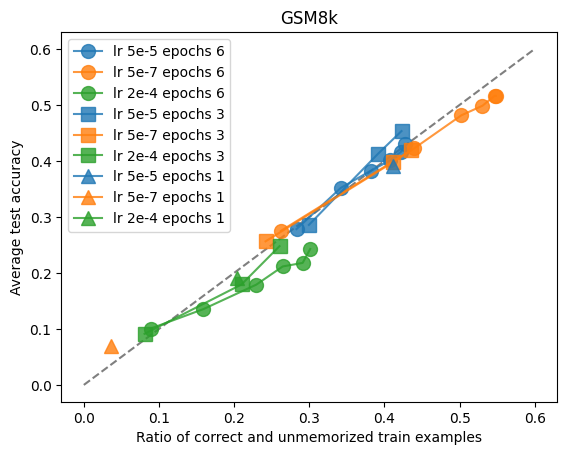

In [100]:


plt.plot([0, 0.6], [0, 0.6], "--", color="black", alpha=0.5)


plt.plot(ratios_dict5["ratio_memorized1"]+ratios_dict5["ratio_unmemorized"], ratios_dict5["avg_test_acc"], "o-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 6")
plt.plot(ratios_dict7["ratio_memorized1"]+ratios_dict7["ratio_unmemorized"], ratios_dict7["avg_test_acc"], "o-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 6")
plt.plot(ratios_dict4["ratio_memorized1"]+ratios_dict4["ratio_unmemorized"], ratios_dict4["avg_test_acc"], "o-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 6")
# plt.plot(ratios_dict7_2["ratio_memorized1"]+ratios_dict7_2["ratio_unmemorized"], ratios_dict7_2["avg_test_acc"], "o-")


plt.plot(ratios_dict5_3["ratio_memorized1"]+ratios_dict5_3["ratio_unmemorized"], ratios_dict5_3["avg_test_acc"], "s-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
plt.plot(ratios_dict7_3["ratio_memorized1"]+ratios_dict7_3["ratio_unmemorized"], ratios_dict7_3["avg_test_acc"], "s-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 3")
plt.plot(ratios_dict4_3["ratio_memorized1"]+ratios_dict4_3["ratio_unmemorized"], ratios_dict4_3["avg_test_acc"], "s-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 3")

# plt.plot(ratios_dict5_6_half["ratio_memorized1"]+ratios_dict5_6_half["ratio_unmemorized"], ratios_dict5_6_half["avg_test_acc"], "P-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
# plt.plot(ratios_dict5_12_quarter["ratio_memorized1"]+ratios_dict5_12_quarter["ratio_unmemorized"], ratios_dict5_12_quarter["avg_test_acc"], "P-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 3")
# plt.plot(ratios_dict5_24_eighth["ratio_memorized1"]+ratios_dict5_24_eighth["ratio_unmemorized"], ratios_dict5_24_eighth["avg_test_acc"], "P-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 3")

plt.plot(ratios_dict5_1["ratio_memorized1"]+ratios_dict5_1["ratio_unmemorized"], ratios_dict5_1["avg_test_acc"], "^-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 1")
plt.plot(ratios_dict7_1["ratio_memorized1"]+ratios_dict7_1["ratio_unmemorized"], ratios_dict7_1["avg_test_acc"], "^-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 1")
plt.plot(ratios_dict4_1["ratio_memorized1"]+ratios_dict4_1["ratio_unmemorized"], ratios_dict4_1["avg_test_acc"], "^-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 1")


plt.legend()


plt.title("GSM8k")

plt.ylabel("Average test accuracy")

plt.xlabel("Ratio of correct and unmemorized train examples")

Text(0.5, 0, 'Ratio of correct and unmemorized train examples')

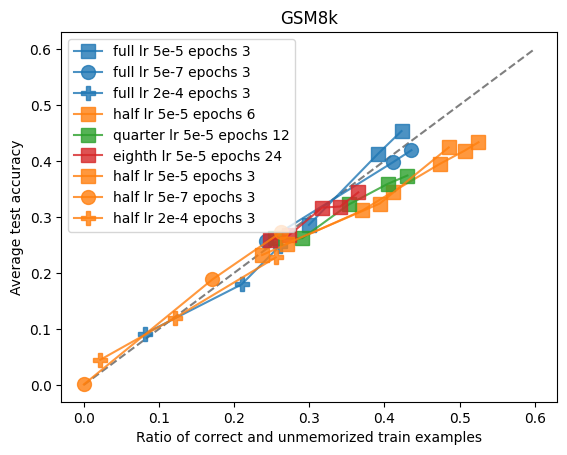

In [101]:


plt.plot([0, 0.6], [0, 0.6], "--", color="black", alpha=0.5)


# plt.plot(ratios_dict5["ratio_memorized1"]+ratios_dict5["ratio_unmemorized"], ratios_dict5["avg_test_acc"], "o-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 6")
# plt.plot(ratios_dict7["ratio_memorized1"]+ratios_dict7["ratio_unmemorized"], ratios_dict7["avg_test_acc"], "o-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 6")
# plt.plot(ratios_dict4["ratio_memorized1"]+ratios_dict4["ratio_unmemorized"], ratios_dict4["avg_test_acc"], "o-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 6")
# plt.plot(ratios_dict7_2["ratio_memorized1"]+ratios_dict7_2["ratio_unmemorized"], ratios_dict7_2["avg_test_acc"], "o-")


plt.plot(ratios_dict5_3["ratio_memorized1"]+ratios_dict5_3["ratio_unmemorized"], ratios_dict5_3["avg_test_acc"], "s-", markersize=10, c="C0", alpha=0.8, label="full lr 5e-5 epochs 3")
plt.plot(ratios_dict7_3["ratio_memorized1"]+ratios_dict7_3["ratio_unmemorized"], ratios_dict7_3["avg_test_acc"], "o-", markersize=10, c="C0", alpha=0.8, label="full lr 5e-7 epochs 3")
plt.plot(ratios_dict4_3["ratio_memorized1"]+ratios_dict4_3["ratio_unmemorized"], ratios_dict4_3["avg_test_acc"], "P-", markersize=10, c="C0", alpha=0.8, label="full lr 2e-4 epochs 3")

plt.plot(ratios_dict5_6_half["ratio_memorized1"]+ratios_dict5_6_half["ratio_unmemorized"], ratios_dict5_6_half["avg_test_acc"], "s-", markersize=10, c="C1", alpha=0.8, label="half lr 5e-5 epochs 6")
plt.plot(ratios_dict5_12_quarter["ratio_memorized1"]+ratios_dict5_12_quarter["ratio_unmemorized"], ratios_dict5_12_quarter["avg_test_acc"], "s-", markersize=10, c="C2", alpha=0.8, label="quarter lr 5e-5 epochs 12")
plt.plot(ratios_dict5_24_eighth["ratio_memorized1"]+ratios_dict5_24_eighth["ratio_unmemorized"], ratios_dict5_24_eighth["avg_test_acc"], "s-", markersize=10, c="C3", alpha=0.8, label="eighth lr 5e-5 epochs 24")


plt.plot(ratios_dict5_3_half["ratio_memorized1"]+ratios_dict5_3_half["ratio_unmemorized"], ratios_dict5_3_half["avg_test_acc"], "s-", markersize=10, c="C1", alpha=0.8, label="half lr 5e-5 epochs 3")
plt.plot(ratios_dict7_3_half["ratio_memorized1"]+ratios_dict7_3_half["ratio_unmemorized"], ratios_dict7_3_half["avg_test_acc"], "o-", markersize=10, c="C1", alpha=0.8, label="half lr 5e-7 epochs 3")
plt.plot(ratios_dict4_3_half["ratio_memorized1"]+ratios_dict4_3_half["ratio_unmemorized"], ratios_dict4_3_half["avg_test_acc"], "P-", markersize=10, c="C1", alpha=0.8, label="half lr 2e-4 epochs 3")



plt.legend()


plt.title("GSM8k")

plt.ylabel("Average test accuracy")

plt.xlabel("Ratio of correct and unmemorized train examples")

In [95]:
# # acc_threhshold = 2.5 
# # perp_threshold = -2.1
# # ratios_dict5 = get_ratios(stats_dict5, acc_threhshold, perp_threshold)
# # ratios_dict7 = get_ratios(stats_dict7, acc_threhshold, perp_threshold)
# # ratios_dict4 = get_ratios(stats_dict4, acc_threhshold, perp_threshold)

# # ratios_dict5_1 = get_ratios(stats_dict5_1, acc_threhshold, perp_threshold)
# # ratios_dict7_1 = get_ratios(stats_dict7_1, acc_threhshold, perp_threshold)
# # ratios_dict4_1 = get_ratios(stats_dict4_1, acc_threhshold, perp_threshold)


# # ratios_dict5_3 = get_ratios(stats_dict5_3, acc_threhshold, perp_threshold)
# # ratios_dict7_3 = get_ratios(stats_dict7_3, acc_threhshold, perp_threshold)
# # ratios_dict4_3 = get_ratios(stats_dict4_3, acc_threhshold, perp_threshold)



# plt.plot([0, 0.6], [0, 0.6], "--", color="black", alpha=0.5)


# plt.plot(ratios_dict5["ratio_memorized1"]+ratios_dict5["ratio_unmemorized"], ratios_dict5["maj_50"], "o-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 6")
# plt.plot(ratios_dict7["ratio_memorized1"]+ratios_dict7["ratio_unmemorized"], ratios_dict7["maj_50"], "o-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 6")
# plt.plot(ratios_dict4["ratio_memorized1"]+ratios_dict4["ratio_unmemorized"], ratios_dict4["maj_50"], "o-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 6")
# # plt.plot(ratios_dict7_2["ratio_memorized1"]+ratios_dict7_2["ratio_unmemorized"], ratios_dict7_2["avg_test_acc"], "o-")


# plt.plot(ratios_dict5_3["ratio_memorized1"]+ratios_dict5_3["ratio_unmemorized"], ratios_dict5_3["maj_50"], "s-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
# plt.plot(ratios_dict7_3["ratio_memorized1"]+ratios_dict7_3["ratio_unmemorized"], ratios_dict7_3["maj_50"], "s-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 3")
# plt.plot(ratios_dict4_3["ratio_memorized1"]+ratios_dict4_3["ratio_unmemorized"], ratios_dict4_3["maj_50"], "s-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 3")


# plt.plot(ratios_dict5_1["ratio_memorized1"]+ratios_dict5_1["ratio_unmemorized"], ratios_dict5_1["maj_50"], "^-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 1")
# plt.plot(ratios_dict7_1["ratio_memorized1"]+ratios_dict7_1["ratio_unmemorized"], ratios_dict7_1["maj_50"], "^-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 1")
# plt.plot(ratios_dict4_1["ratio_memorized1"]+ratios_dict4_1["ratio_unmemorized"], ratios_dict4_1["maj_50"], "^-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 1")


# plt.legend()


# plt.title("GSM8k")

# plt.ylabel("Test Maj@50")

# plt.xlabel("Ratio of correct and unmemorized train examples")

In [419]:
maj50_5 = [get_n_maj_acc(stats_dict5["test_samples_all"][i], 50) for i in range(len(stats_dict5["test_samples_all"]))]
maj50_7 = [get_n_maj_acc(stats_dict7["test_samples_all"][i], 50) for i in range(len(stats_dict7["test_samples_all"]))]
maj50_4 = [get_n_maj_acc(stats_dict4["test_samples_all"][i], 50) for i in range(len(stats_dict4["test_samples_all"]))]

maj50_5_1 = [get_n_maj_acc(stats_dict5_1["test_samples_all"][i], 50) for i in range(len(stats_dict5_1["test_samples_all"]))]
maj50_7_1 = [get_n_maj_acc(stats_dict7_1["test_samples_all"][i], 50) for i in range(len(stats_dict7_1["test_samples_all"]))]
maj50_4_1 = [get_n_maj_acc(stats_dict4_1["test_samples_all"][i], 50) for i in range(len(stats_dict4_1["test_samples_all"]))]

maj50_5_3 = [get_n_maj_acc(stats_dict5_3["test_samples_all"][i], 50) for i in range(len(stats_dict5_3["test_samples_all"]))]
maj50_7_3 = [get_n_maj_acc(stats_dict7_3["test_samples_all"][i], 50) for i in range(len(stats_dict7_3["test_samples_all"]))]
maj50_4_3 = [get_n_maj_acc(stats_dict4_3["test_samples_all"][i], 50) for i in range(len(stats_dict4_3["test_samples_all"]))]

Text(0.5, 0, 'Test Maj@1')

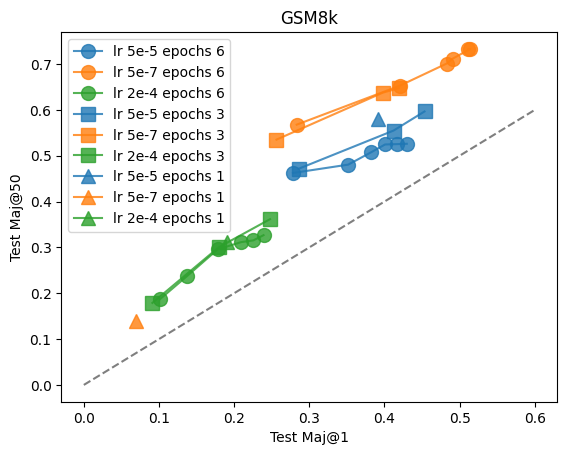

In [421]:


plt.plot([0, 0.6], [0, 0.6], "--", color="black", alpha=0.5)


plt.plot(ratios_dict5["avg_test_acc"], maj50_5, "o-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 6")
plt.plot(ratios_dict7["avg_test_acc"], maj50_7, "o-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 6")
plt.plot(ratios_dict4["avg_test_acc"], maj50_4, "o-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 6")

plt.plot(ratios_dict5_3["avg_test_acc"], maj50_5_3, "s-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
plt.plot(ratios_dict7_3["avg_test_acc"], maj50_7_3, "s-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 3")
plt.plot(ratios_dict4_3["avg_test_acc"], maj50_4_3, "s-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 3")

plt.plot(ratios_dict5_1["avg_test_acc"], maj50_5_1, "^-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 1")
plt.plot(ratios_dict7_1["avg_test_acc"], maj50_7_1, "^-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 1")
plt.plot(ratios_dict4_1["avg_test_acc"], maj50_4_1, "^-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 1")


plt.legend()


plt.title("GSM8k")

plt.ylabel("Test Maj@50")

plt.xlabel("Test Maj@1")

In [96]:


# plt.plot([0, 0.6], [0, 0.6], "--", color="black", alpha=0.5)

# constant = 0
# constant2 = 0.7
# plt.plot(constant2*ratios_dict5["ratio_memorized1"]+ratios_dict5["ratio_unmemorized"]-constant*ratios_dict5["ratio_memorized2"], maj50_5, "o-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 6")
# plt.plot(constant2*ratios_dict7["ratio_memorized1"]+ratios_dict7["ratio_unmemorized"]-constant*ratios_dict7["ratio_memorized2"], maj50_7, "o-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 6")
# plt.plot(constant2*ratios_dict4["ratio_memorized1"]+ratios_dict4["ratio_unmemorized"]-constant*ratios_dict4["ratio_memorized2"], maj50_4, "o-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 6")
# # plt.plot(ratios_dict7_2["ratio_memorized1"]+ratios_dict7_2["ratio_unmemorized"], ratios_dict7_2["avg_test_acc"], "o-")


# plt.plot(constant2*ratios_dict5_3["ratio_memorized1"]+ratios_dict5_3["ratio_unmemorized"]-constant*ratios_dict5_3["ratio_memorized2"], maj50_5_3, "s-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 3")
# plt.plot(constant2*ratios_dict7_3["ratio_memorized1"]+ratios_dict7_3["ratio_unmemorized"]-constant*ratios_dict7_3["ratio_memorized2"], maj50_7_3, "s-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 3")
# plt.plot(constant2*ratios_dict4_3["ratio_memorized1"]+ratios_dict4_3["ratio_unmemorized"]-constant*ratios_dict4_3["ratio_memorized2"], maj50_4_3, "s-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 3")


# plt.plot(constant2*ratios_dict5_1["ratio_memorized1"]+ratios_dict5_1["ratio_unmemorized"]-constant*ratios_dict5_1["ratio_memorized2"], maj50_5_1, "^-", markersize=10, c="C0", alpha=0.8, label="lr 5e-5 epochs 1")
# plt.plot(constant2*ratios_dict7_1["ratio_memorized1"]+ratios_dict7_1["ratio_unmemorized"]-constant*ratios_dict7_1["ratio_memorized2"], maj50_7_1, "^-", markersize=10, c="C1", alpha=0.8, label="lr 5e-7 epochs 1")
# plt.plot(constant2*ratios_dict4_1["ratio_memorized1"]+ratios_dict4_1["ratio_unmemorized"]-constant*ratios_dict4_1["ratio_memorized2"], maj50_4_1, "^-", markersize=10, c="C2", alpha=0.8, label="lr 2e-4 epochs 1")


# plt.legend()


# plt.title("GSM8k")

# plt.ylabel("Average test accuracy")

# plt.xlabel("Ratio of correct and unmemorized train examples")

In [389]:
np.e**np.e**(-2.5)

1.0855480760008809

In [138]:
dict4["ratio_memorized2"]+dict4["ratio_unmemorized"]

array([0.09273384, 0.20915295, 0.42660244, 0.6119363 , 0.72741871,
       0.76809849])

In [139]:
dict4["ratio_unmemorized"]

array([0.07801418, 0.09206477, 0.06476649, 0.03037602, 0.01164191,
       0.00588786])

In [140]:
dict4["ratio_memorized2"]

array([0.01471966, 0.11708818, 0.36183594, 0.58156028, 0.7157768 ,
       0.76221062])

In [27]:
ratios_dict5_24_eighth

{'ratio_incorrect': array([0.73558143, 0.6332129 , 0.51947009, 0.45323163, 0.40492439]),
 'ratio_unmemorized': array([0.24822695, 0.21704804, 0.20125786, 0.19389803, 0.20099023]),
 'ratio_memorized1': array([0.        , 0.05606851, 0.11588385, 0.14719657, 0.16419109]),
 'ratio_memorized2': array([0.01619162, 0.09367055, 0.1633882 , 0.20567376, 0.22989429]),
 'avg_test_acc': array([0.25883245, 0.26747536, 0.31660349, 0.31857468, 0.34389689])}

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(0.0, 1.0)

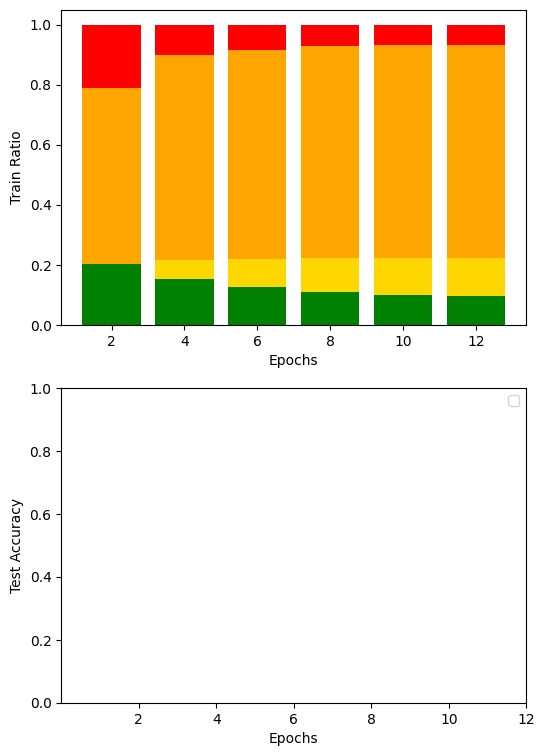

In [49]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 6*1.5))

ratio_incorrect = ratios_dict7_6_qwen["ratio_incorrect"]
ratio_memorized1 = ratios_dict7_6_qwen["ratio_memorized1"]
ratio_memorized2 = ratios_dict7_6_qwen["ratio_memorized2"]


num_epochs = len(ratio_incorrect)


ax1.bar([i for i in range(1, num_epochs+1)], [1 for i in range(num_epochs)], color = "red", label = "Incorrect")
ax1.bar([i for i in range(1, num_epochs+1)], [1-ratio_incorrect[i] for i in range(num_epochs)], color = "orange", label = "Correct Memorized")
ax1.bar([i for i in range(1, num_epochs+1)], [1-ratio_incorrect[i]-ratio_memorized2[i] for i in range(num_epochs)], color = "gold", label = "Correct Unmemorized to Memorized")
ax1.bar([i for i in range(1, num_epochs+1)], [1-ratio_incorrect[i]-ratio_memorized2[i]-ratio_memorized1[i] for i in range(num_epochs)], color = "green", label = "Correct Unmemorized")

ax1.set_xticks([i for i in range(1, num_epochs+1)], [2*i for i in range(1, num_epochs+1)])
ax1.set_ylabel("Train Ratio")
ax1.set_xlabel("Epochs")

# ax1.set_title(train_name)


ax2.set_xticks([i for i in range(1, num_epochs+1)], [2*i for i in range(1, num_epochs+1)])
ax2.set_ylabel("Test Accuracy")
ax2.set_xlabel("Epochs")
ax2.legend()
ax2.set_ylim(0, 1)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(0.0, 1.0)

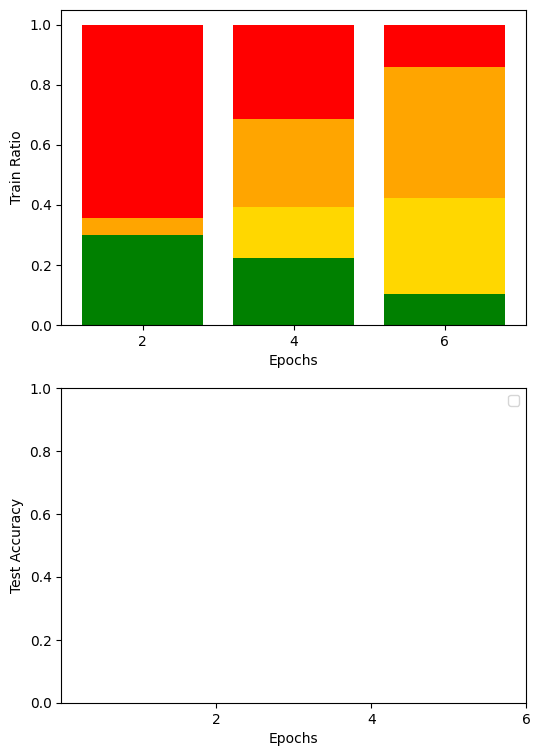

In [51]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 6*1.5))

ratio_incorrect = ratios_dict5_3["ratio_incorrect"]
ratio_memorized1 = ratios_dict5_3["ratio_memorized1"]
ratio_memorized2 = ratios_dict5_3["ratio_memorized2"]


ax1.bar([i for i in range(1, 4)], [1 for i in range(3)], color = "red", label = "Incorrect")
ax1.bar([i for i in range(1, 4)], [1-ratio_incorrect[i] for i in range(3)], color = "orange", label = "Correct Memorized")
ax1.bar([i for i in range(1, 4)], [1-ratio_incorrect[i]-ratio_memorized2[i] for i in range(3)], color = "gold", label = "Correct Unmemorized to Memorized")
ax1.bar([i for i in range(1, 4)], [1-ratio_incorrect[i]-ratio_memorized2[i]-ratio_memorized1[i] for i in range(3)], color = "green", label = "Correct Unmemorized")

ax1.set_xticks([i for i in range(1, 4)], [2*i for i in range(1, 4)])
ax1.set_ylabel("Train Ratio")
ax1.set_xlabel("Epochs")

# ax1.set_title(train_name)


ax2.set_xticks([i for i in range(1, 4)], [2*i for i in range(1, 4)])
ax2.set_ylabel("Test Accuracy")
ax2.set_xlabel("Epochs")
ax2.legend()
ax2.set_ylim(0, 1)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(0.0, 1.0)

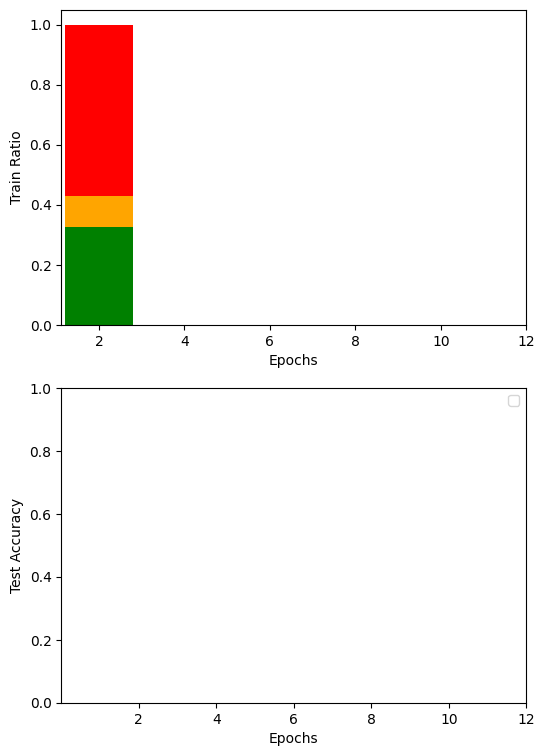

In [17]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 6*1.5))

ratio_incorrect = ratios_dict5_6_eighth["ratio_incorrect"]
ratio_memorized1 = ratios_dict5_6_eighth["ratio_memorized1"]
ratio_memorized2 = ratios_dict5_6_eighth["ratio_memorized2"]


ax1.bar([i for i in range(1,2)], [1 for i in range(1)], color = "red", label = "Incorrect")
ax1.bar([i for i in range(1,2)], [1-ratio_incorrect[i] for i in range(1)], color = "orange", label = "Correct Memorized")
ax1.bar([i for i in range(1,2)], [1-ratio_incorrect[i]-ratio_memorized2[i] for i in range(1)], color = "gold", label = "Correct Unmemorized to Memorized")
ax1.bar([i for i in range(1,2)], [1-ratio_incorrect[i]-ratio_memorized2[i]-ratio_memorized1[i] for i in range(1)], color = "green", label = "Correct Unmemorized")

ax1.set_xticks([i for i in range(1, 7)], [2*i for i in range(1, 7)])
ax1.set_ylabel("Train Ratio")
ax1.set_xlabel("Epochs")

# ax1.set_title(train_name)


ax2.set_xticks([i for i in range(1, 7)], [2*i for i in range(1, 7)])
ax2.set_ylabel("Test Accuracy")
ax2.set_xlabel("Epochs")
ax2.legend()
ax2.set_ylim(0, 1)


In [95]:
num_correct_all = 50 - num_incorrect_all

In [77]:
train_correct = (np.load("ckpts/"+train_name+"/checkpoint-233"+ "/train_answer_types5_seed2.npy")==0)
train_samples = (np.load("ckpts/"+train_name+"/checkpoint-233"+ "/train_answers5_seed2.npy"))

In [92]:
memorized_idxs = np.where(np.log(np.log(perplexities_all[3]))<=-3)[0]
unmemorized_idxs = np.where(np.log(np.log(perplexities_all[3]))>-3)[0]

In [93]:
for idx in unmemorized_idxs:
    print(train_samples[idx])

[' Natalia sold 48 / 2 = <<48/2=24>>24 clips in May.\nSo, she sold a total of 48 + 24 = <<48+24=72>>72 clips in April and May.\n#### 72'
 ' Natalia sold clips to 48 / 2 = <<48/2=24>>24 friends in May.\nShe sold a total of 48 + 24 = <<48+24=72>>72 clips to her friends in April and May.\n#### 72'
 ' Natalia sold 48 / 2 = <<48/2=24>>24 clips in May.\nSo she sold a total of 24 + 48 = <<24+48=72>>72 clips.\n#### 72'
 ' In May, Natalia sold 48/2= <<48/2=24>>24 clips.\nAltogether, she sold 48+24= <<48+24=72>>72 clips.\n#### 72'
 ' Natalia sold clips to 48 / 2 = <<48/2=24>>24 of her friends in May.\nIn total Natalia sold clips to 48 + 24 = <<48+24=72>>72 of her friends in April and May.\n#### 72']
[' Weng worked for 50/60 = <<50/60=0.8333>>0.8333 hours.\nSo, she earned 0.8333 x $12 = $<<0.8333*12=10>>10.\n#### 10'
 ' Weng earned $12 x 50/60 = $<<12*50/60=10>>10 for the 50 minutes of babysitting.\n#### 10'
 ' Weng earned $<<12*50*.01=600>>600 because 12 x 50 x .01 = <<12*50*.01=600>>600\n#### 6

(array([0.14445058, 0.09077858, 0.09475428, 0.09806737, 0.15637769,
        0.61557151]),
 array([0.        , 0.83333333, 1.66666667, 2.5       , 3.33333333,
        4.16666667, 5.        ]),
 <BarContainer object of 6 artists>)

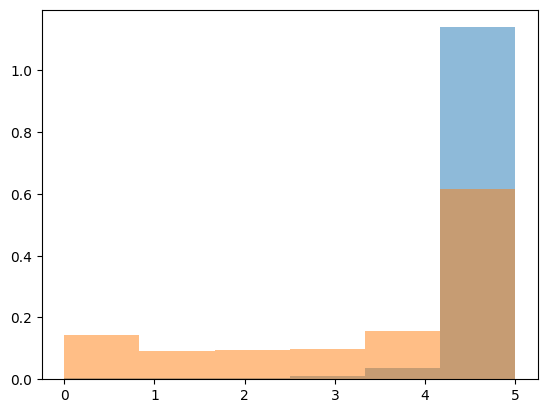

In [81]:
plt.hist(num_correct_all[3, memorized_idxs], bins=6, alpha=0.5, label='memorized', density=True)
plt.hist(num_correct_all[3, unmemorized_idxs], bins=6, alpha=0.5, label='unmemorized', density=True)

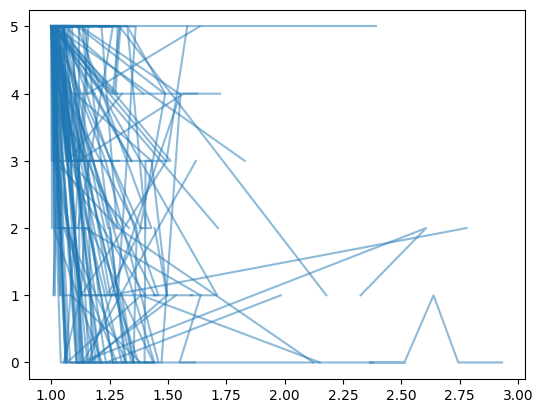

In [39]:
for i in range(100):
    plt.plot(((perplexities_all[:, i])), num_correct_all[:,i],  c="C0", alpha=0.5)

(array([1.000e+00, 5.000e+00, 2.100e+01, 1.280e+02, 3.620e+02, 7.900e+02,
        1.126e+03, 7.350e+02, 1.810e+02, 1.500e+01]),
 array([-3.25809558, -2.87601564, -2.4939357 , -2.11185576, -1.72977582,
        -1.34769588, -0.96561594, -0.583536  , -0.20145606,  0.18062388,
         0.56270382]),
 <BarContainer object of 10 artists>)

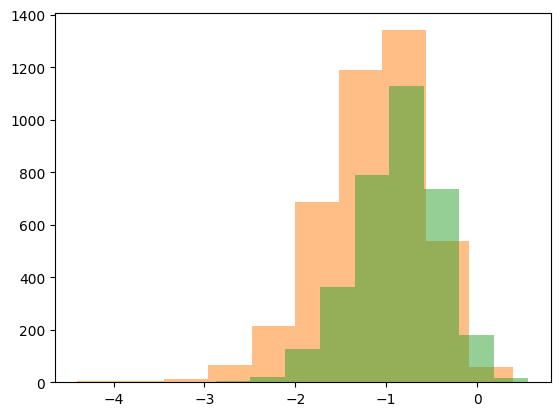

In [91]:
ckpt_idxs = 5

subsample_idxs1 = np.where(num_memorized_all[ckpt_idxs, :] > 2.5)[0]
subsample_idxs2 = np.where(num_correct_different_all[ckpt_idxs, :] > 2.5)[0]
subsample_idxs3 = np.where(num_incorrect_all[ckpt_idxs, :] > 2.5)[0]
subsample_idxs4 = np.where(num_incorrect_all[ckpt_idxs, :] < 2.5)[0]

plt.hist(np.log(np.log(perplexities_all[ckpt_idxs, subsample_idxs1])), alpha=0.5, label="0")
plt.hist(np.log(np.log(perplexities_all[ckpt_idxs, subsample_idxs4])), alpha=0.5, label="0")
plt.hist(np.log(np.log(perplexities_all[ckpt_idxs, subsample_idxs3])), alpha=0.5, label="0")




In [46]:
np.log(np.log(perplexities_all[3, subsample_idxs]))

array([-7.30224997, -5.52540563, -6.62528966, ..., -4.12148626,
       -6.30241297, -5.98576153])

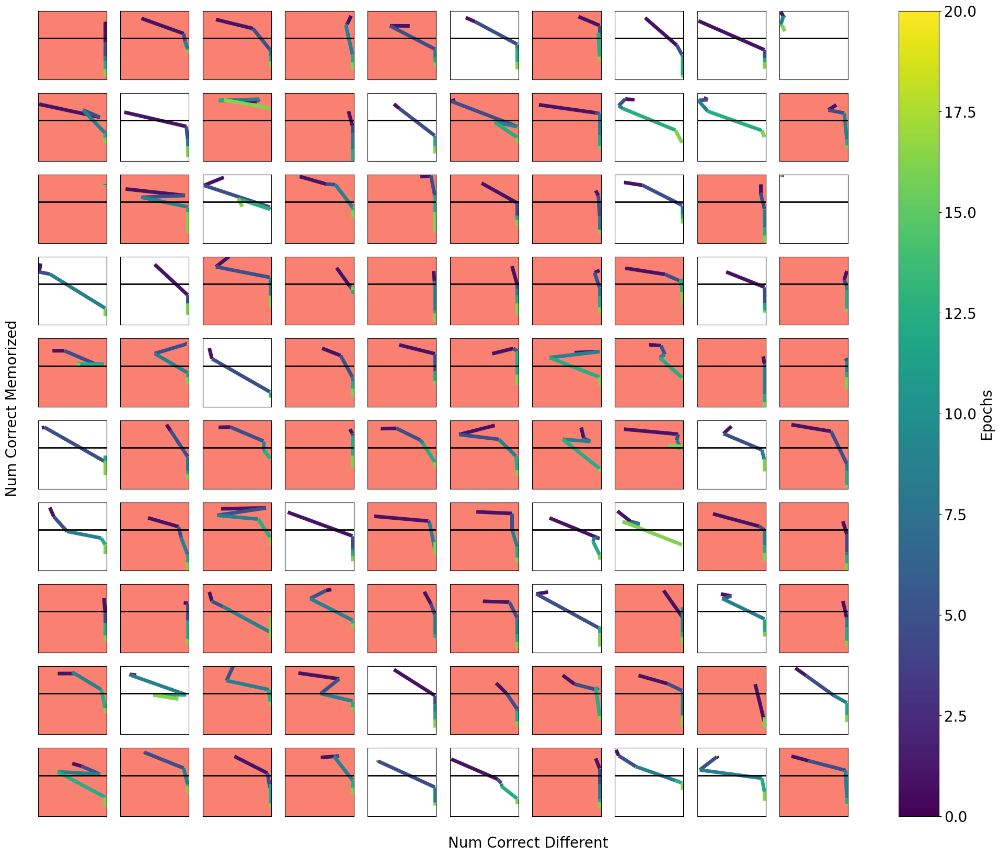

In [97]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap


# Create a gradient color map
cmap = plt.get_cmap('viridis')
# Create the plot
fig, ax = plt.subplots(10, 10, figsize=(25, 20))

# Create an array of values to use for coloring each segment
color_values = np.linspace(1, 20, 6)




for i in range(100):
    # x = num_correct_different_all1[:, i]+np.random.uniform(-0.5, 0.5, 6)
    # y = num_memorized_all1[:, i]+np.random.uniform(-0.5, 0.5, 6)
    x = num_correct_all[:, i]
    y = (np.log(np.log(perplexities_all[:, i])))
    # Create line segments
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    # Create a LineCollection from the segments
    lc = LineCollection(segments, cmap=cmap, norm=plt.Normalize(0, 20), alpha=1)
    lc.set_array(color_values)
    lc.set_linewidth(5)


    ax[i//10][i%10].add_collection(lc)
    ax[i//10][i%10].autoscale()
    ax[i//10][i%10].set_xlim(-1, 51)
    ax[i//10][i%10].set_ylim(-10, 0)
    ax[i//10][i%10].axhline(-4, color='black', lw=2)
    ax[i//10][i%10].set_yticks([])
    ax[i//10][i%10].set_xticks([])
    
    if max(num_correct_different_all[:, i])>25:
        ax[i//10][i%10].set_facecolor('salmon')

# # Plot markers at the start of each segment
# ax.plot(x, y, 'o', color='black')

# Add a colorbar
cbar = plt.colorbar(lc, ax=ax)
cbar.ax.tick_params(labelsize=20) 

cbar.set_label('Epochs', fontsize=20)

# add x label to entire plot

fig.text(0.5, 0.08, 'Num Correct Different', ha='center', fontsize=20)
fig.text(0.1, 0.5, 'Num Correct Memorized', va='center', rotation='vertical', fontsize=20)

plt.savefig("delete.png")

In [26]:
y

array([-1.19621188, -1.87324072, -3.27483479, -7.34044019, -8.17061632,
       -8.35976372])